# FYP OSNR: Data Processing

Imports:

In [132]:
import numpy as np
from scipy.fft import fft, ifft
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

## TEST CASE: Sum of sinusoids

As a test case, we can combine two sinusoids to create the signal before filtering. The second sinusoid `sinusoid_2` is the noise signal that we want to remove. They are both plotted together below:

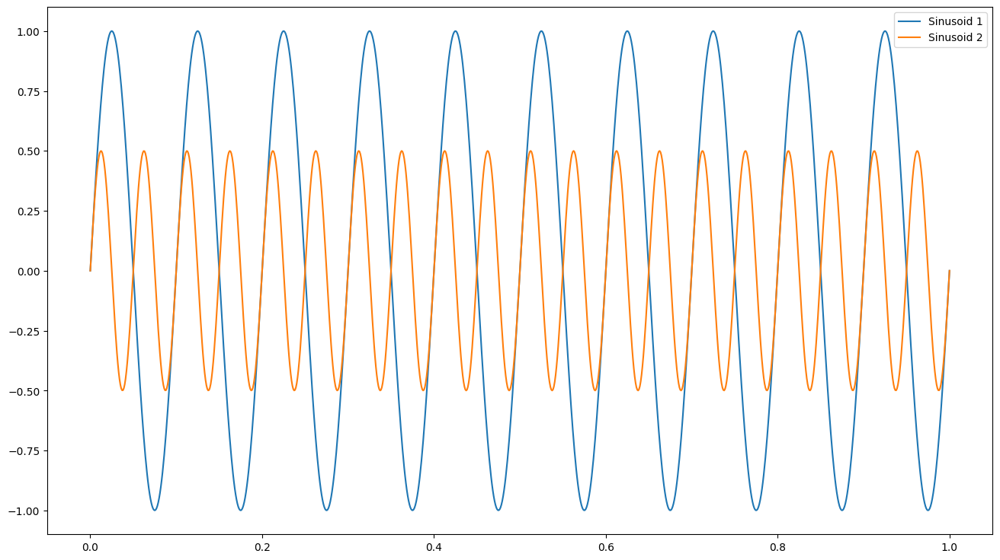

In [2]:
# define the time range and the frequencies used
t = np.linspace(0, 1, 1000)
f1, f2 = 10, 20

# define the sinusoids, sinusoid_1 is the desired signal, while sinusoid_2 is the noise
sinusoid_1 = np.sin(2 * np.pi * f1 * t)
sinusoid_2 = 0.5 * np.sin(2 * np.pi * f2 * t)
# signal is the sum of these
signal = sinusoid_1 + sinusoid_2

# plot both sinusoids to see what they look like individually
# we will plot the signal later
fig, ax = plt.subplots(
    1, 1,
    figsize=(16, 9)
)

# Plot the two sinusoids that make up the signal
ax.plot(t, sinusoid_1, label='Sinusoid 1')
ax.plot(t, sinusoid_2, label='Sinusoid 2')
ax.legend()

Now we perform a FFT on the signal, in order to look at it in the frequency domain. This allows us to search for a specific frequency (in this case, that of the noise signal) and remove it by setting it equal to zero. Then, we can perform an inverse-FFT to get the new filtered signal:

In [3]:
# Compute the FFT
fft_signal = fft(signal)

# Remove the noise component at frequency f2
noise_freq = f2
# get the frequencies corresponding to each element in the fft_signal array
freqs = np.fft.fftfreq(signal.size, t[1] - t[0])
# if one of these frequencies is the noise_freq, it should be the minimum value of zero
noise_index = np.abs(freqs - noise_freq).argmin()
# remove this frequency
fft_signal[noise_index] = 0

# Compute the inverse FFT
filtered_signal = ifft(fft_signal)

Now we can plot the unfiltered signal and our new filtered signal, this filtered signal is also compared with the original `sinusoid_1` which we were trying to obtain:

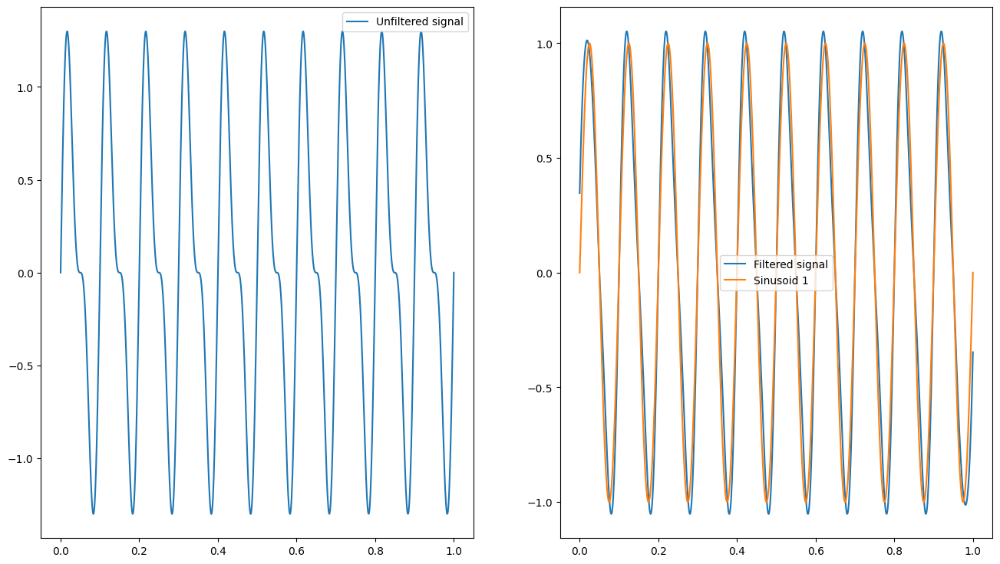

In [4]:
fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 9)
)

# Plot the unfiltered signal and the filtered signal
axes[0].plot(t, signal, label='Unfiltered signal')
axes[0].legend()

axes[1].plot(t, filtered_signal.real, label='Filtered signal')
axes[1].plot(t, sinusoid_1, label='Sinusoid 1')
axes[1].legend()

Notice that the filtered signal is now slightly different to the original Sinusoid, but is much better than the unfiltered signal.

## USE CASE: Filtering the WSS Data

First we must obtain the WSS Data, it is imported and plotted as follows:

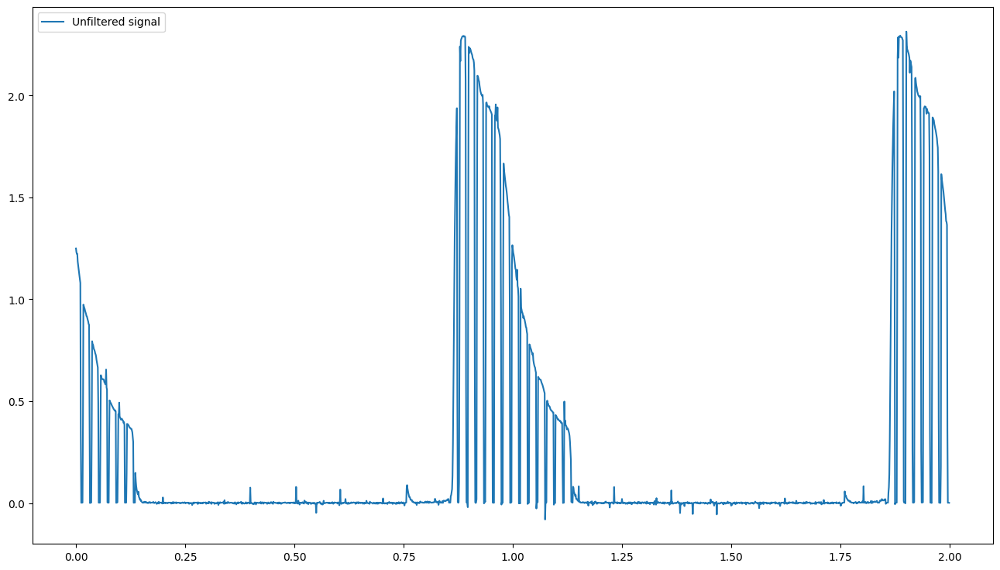

In [52]:
# import the data from the text file
t, signal = np.loadtxt('on_channels/reading_001.txt', delimiter=',', skiprows=1).T

# plot both sinusoids to see what they look like individually
# we will plot the signal later
fig, ax = plt.subplots(
    1, 1,
    figsize=(16, 9)
)

# Plot the unfiltered signal
ax.plot(t, signal, label='Unfiltered signal')
ax.legend()

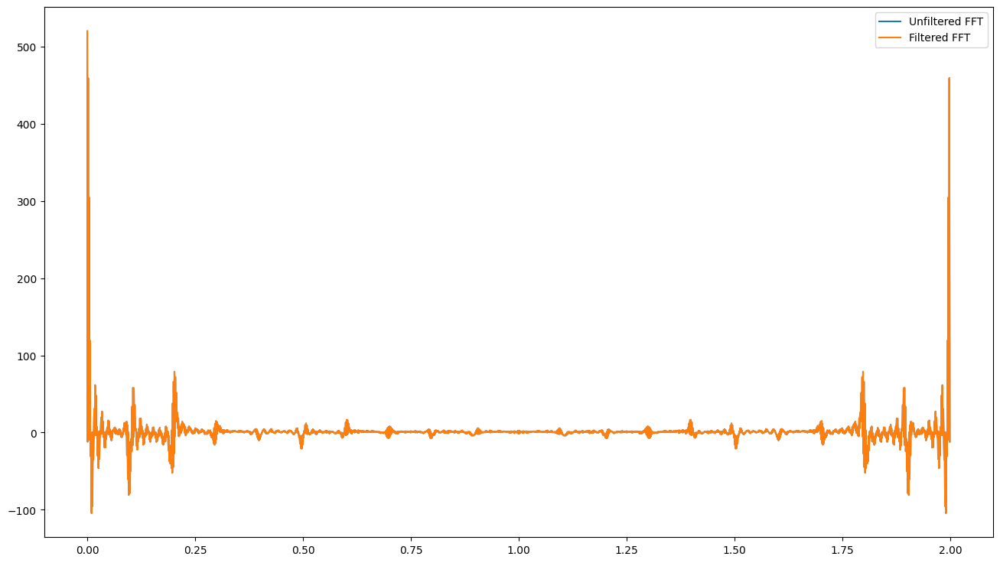

In [53]:
# Compute the FFT
fft_signal = fft(signal)
cut_fft_signal = fft_signal.copy()

# Remove the noise component at frequency f2
noise_freq = 10
# get the frequencies corresponding to each element in the fft_signal array
freqs = np.fft.fftfreq(signal.size, t[1] - t[0])
# if one of these frequencies is the noise_freq, it should be the minimum value of zero
noise_index = np.abs(freqs) >= noise_freq # np.abs(freqs - noise_freq).argmin()
# remove this frequency
cut_fft_signal[noise_index] = 0

# Compute the inverse FFT
filtered_signal = ifft(cut_fft_signal)

# plot both sinusoids to see what they look like individually
# we will plot the signal later
fig, ax = plt.subplots(
    1, 1,
    figsize=(16, 9)
)

# Plot the filtered and unfiltered FFT
ax.plot(t, fft_signal.real, label='Unfiltered FFT')
ax.plot(t, cut_fft_signal.real, label='Filtered FFT')
ax.legend()

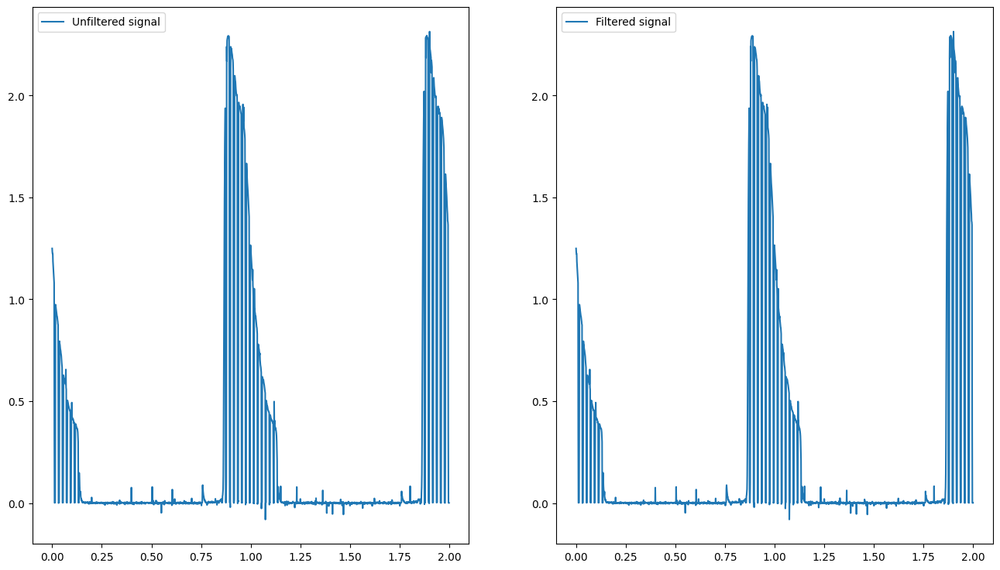

In [54]:
fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 9)
)

# Plot the unfiltered signal and the filtered signal
axes[0].plot(t, signal, label='Unfiltered signal')
axes[0].legend()

axes[1].plot(t, filtered_signal.real, label='Filtered signal')
axes[1].legend()

adjacent_channels with noise:
`002`
`005`
`008`

on_channels with noise:
`001`
`002`
`003`

off_channels, it's all noise of course.

## MATCHING SHAPES

Since the signals are all taken over time, the channels we want to look at can be taken at different points in time depending on the measurement. However, the general shape should be the same (except for when we start turning off channels). The following function takes the times, signal, and on-signal, and compares the signal to the on-signal. It then shifts the signal by one timestep until its passed over every timestep and takes the most accurate match:

In [ ]:
def get_match(t, signal, signal_on):
    # set sum of squared errors to infinity
    sse = np.inf
    # initialise the signal we return as our current signal
    new_signal = signal.copy()
    
    # loop through each element
    for i in range(len(t)):
        # roll the array so that i values at end are moved to start
        test_signal = np.roll(signal, i)
        # get the sse of this test signal compared to the on signal
        test_sse = sum(np.abs(test_signal - signal_on)**2)
        # if the new sse is smaller than previous
        if test_sse < sse:
            # set new sse
            sse = test_sse
            # set new signal
            new_signal = test_signal
    
    return new_signal

The on-signal we want to use for comparison is as follows:

In [ ]:
# import the on data from the text file
t_on, signal_on = np.loadtxt(f'on_channels/reading_012.txt', delimiter=',', skiprows=1).T
# fix data by only taking first second of it (as it is periodic with 1s), total data is 2s long so half it
t_on = t_on[:len(t_on)//2]
signal_on = signal_on[:len(signal_on)//2]

We can then pass through many readings and get this fixed signal, plotting it with the on-signal and the difference between them:

*Notice that some are not matched correctly*

C:\Users\seani\AppData\Local\Temp\ipykernel_1408\2833683439.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(


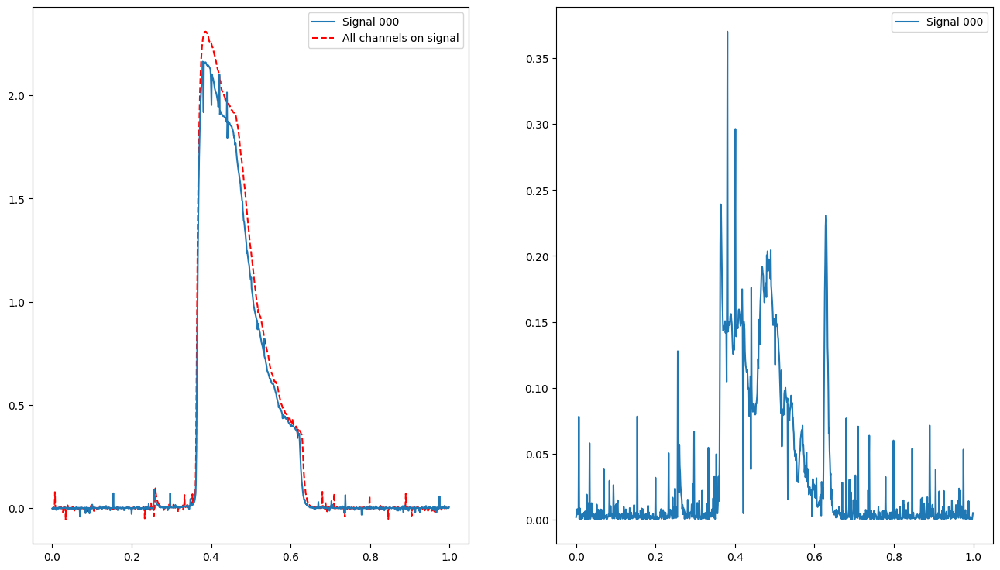

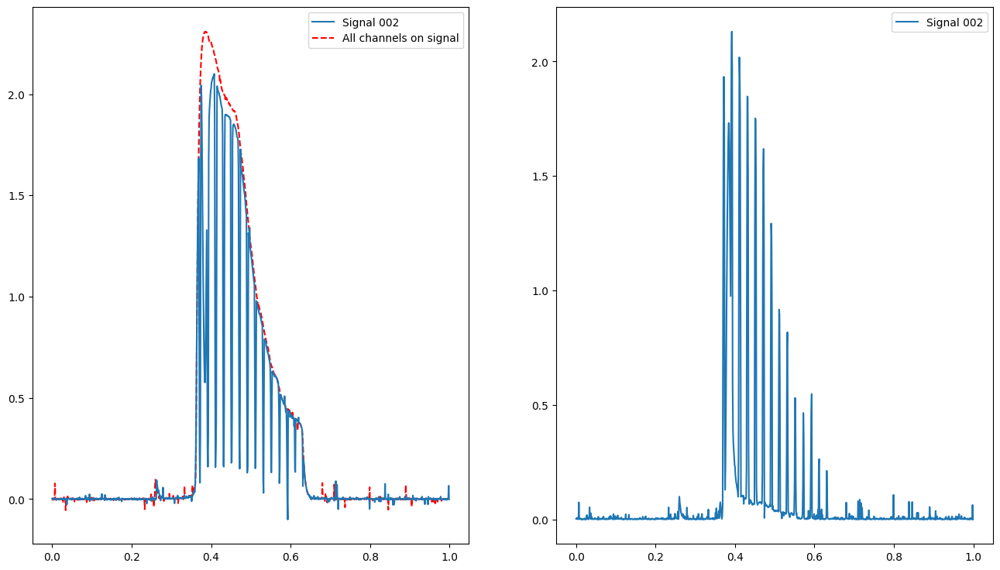

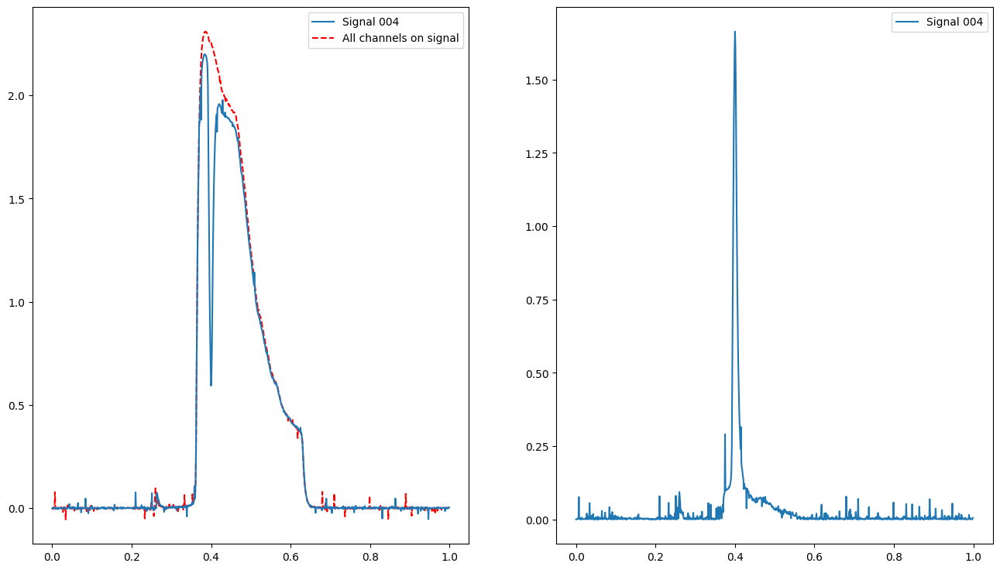

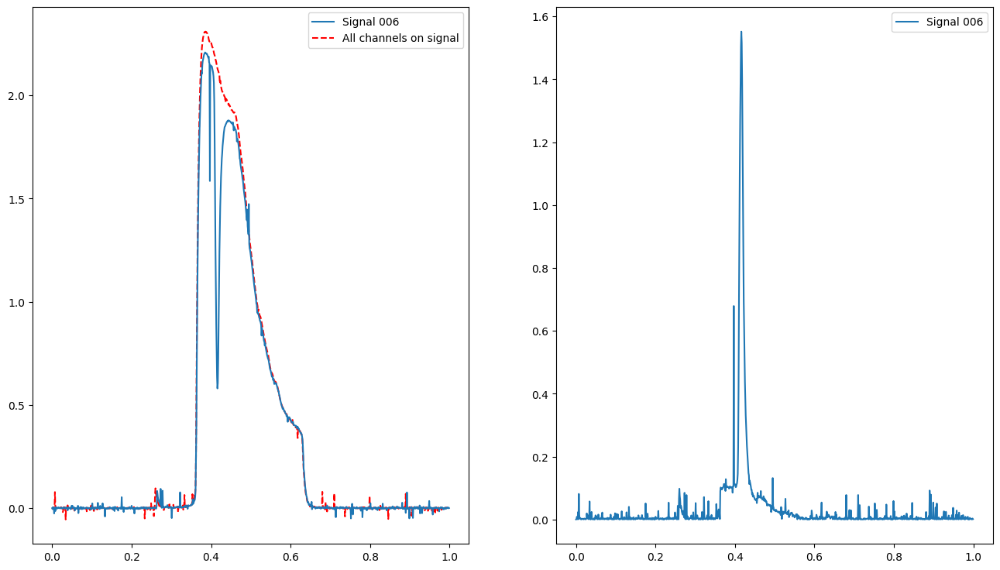

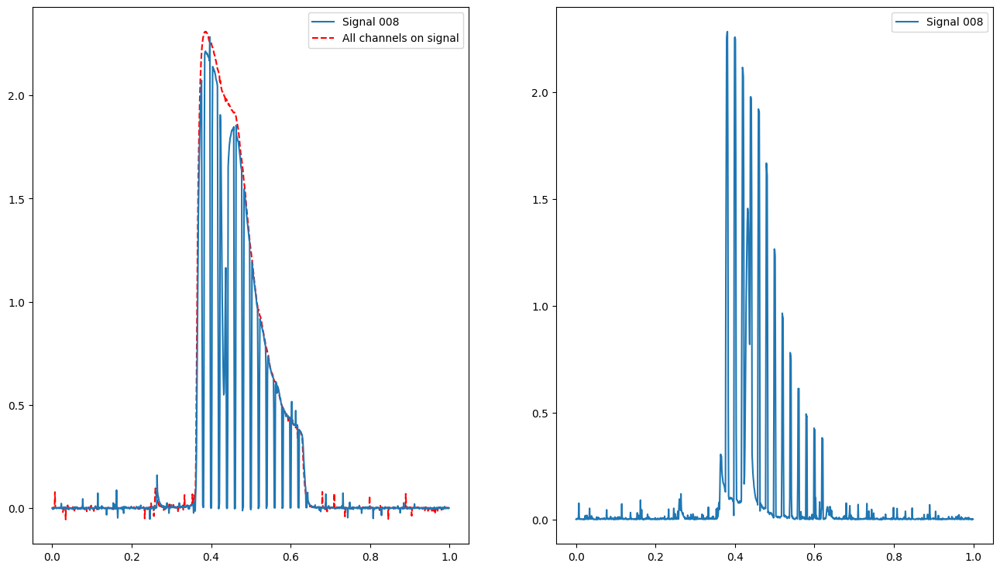

...

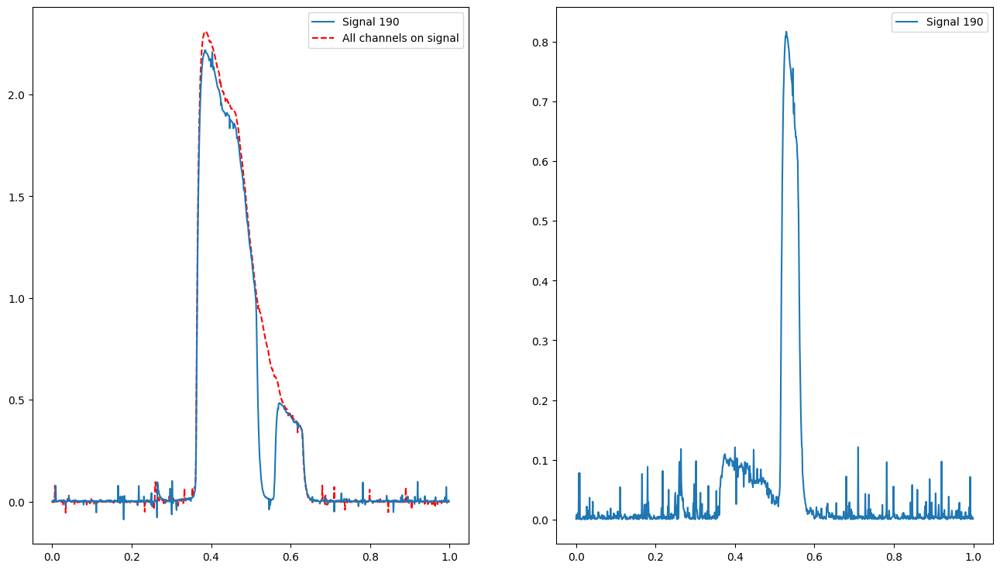

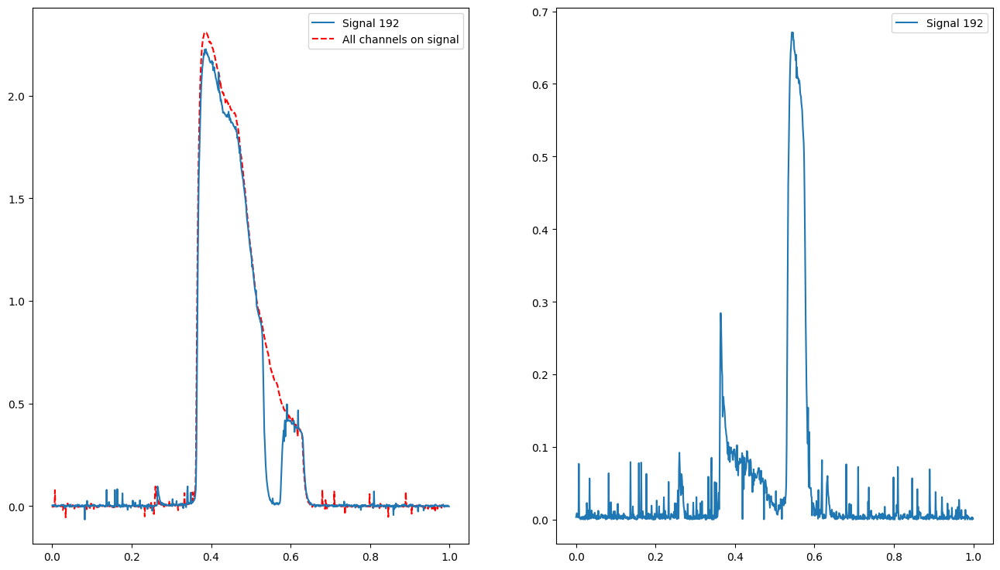

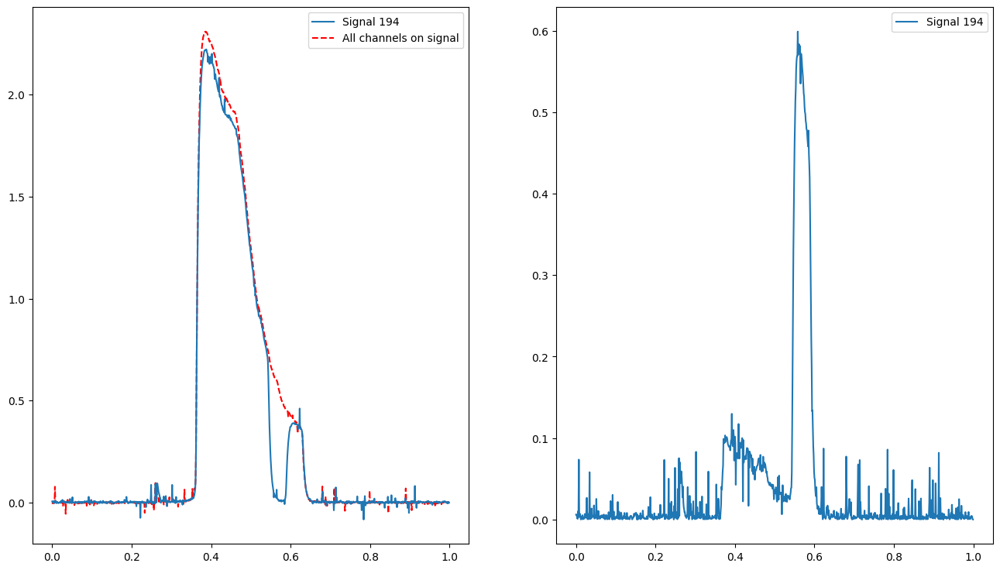

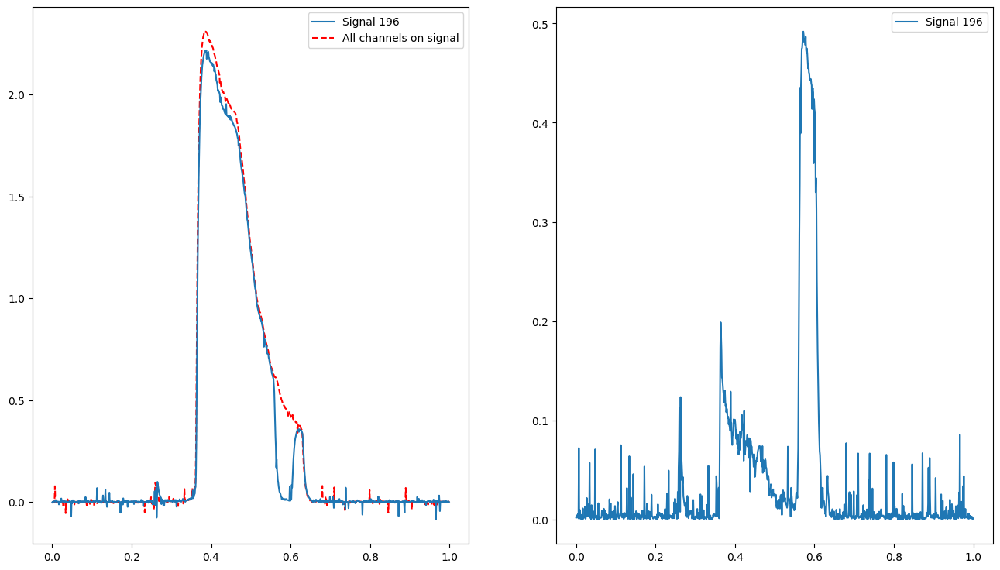

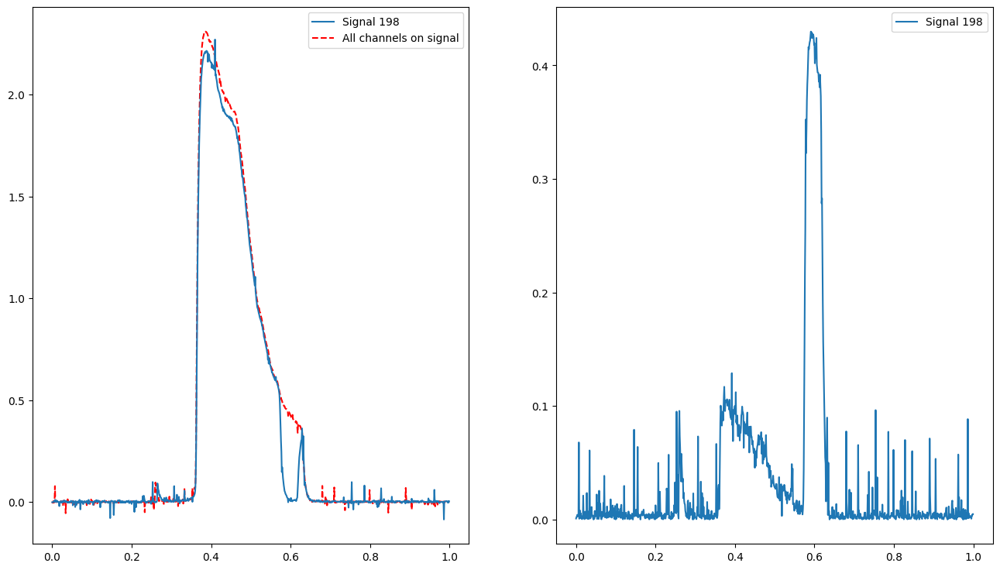

In [136]:
for i in range(0, 200, 2):
    # import the data from the text file
    t, signal = np.loadtxt(f'adjacent_channels/reading_{i:03}.txt', delimiter=',', skiprows=1).T
    # fix data by only taking first second of it (as it is periodic with 1s), total data is 2s long so half it
    t = t[:len(t)//2]
    signal = signal[:len(signal)//2]
    
    # fix the signal so it is in the center
    fixed_signal = get_match(t, signal, signal_on)

    # PLOTTING
    fig, axes = plt.subplots(
        1, 2,
        figsize=(16, 9)
    )

    # Plot the fixed signal with the on signal
    axes[0].plot(t, fixed_signal, label=f'Signal {i:03}', zorder=1)
    axes[0].plot(t, signal_on, label=f'All channels on signal', color='r', ls='--', zorder=0)
    axes[0].legend()

    # Plot the difference between them
    axes[1].plot(t, np.abs(fixed_signal - signal_on), label=f'Signal {i:03}', zorder=1)
    axes[1].legend()

If we want to create a `.gif` of these fixed signals, we can do as follows:

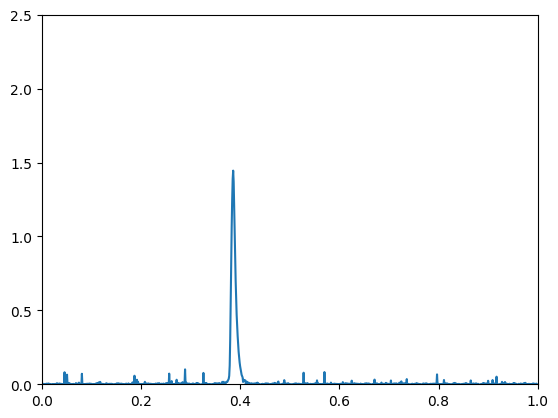

In [133]:
# the fig used
fig,ax = plt.subplots()

def animate(i):
    # import the data from the text file
    t, signal = np.loadtxt(f'adjacent_channels/reading_{i:03}.txt', delimiter=',', skiprows=1).T
    # fix data by only taking first second of it (as it is periodic with 1s), total data is 2s long so half it
    t = t[:len(t)//2]
    signal = signal[:len(signal)//2]
    
    # fix the signal so it is in the center
    fixed_signal = get_match(t, signal, signal_on)
    
    ax.clear()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 2.5)
    
    line, = ax.plot(t, fixed_signal)
    
    return line
        
ani = FuncAnimation(fig, animate, frames=665)
ani.save("adjacent_channels.gif", dpi=300, writer=PillowWriter(fps=10))